In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

import preprocessing as pp

In [2]:
raw_data = pd.read_csv('consumption_and_temperatures.csv')
raw_data

,timestamp,NO1_consumption,NO1_temperature,NO2_consumption,NO2_temperature,NO3_consumption,NO3_temperature,NO4_consumption,NO4_temperature,NO5_consumption,NO5_temperature
0,2017-05-01 00:00:00+00:00,3325.431995,2.1,3534.588000,5.0,2674.838000,5.5,2061.209000,0.2,1609.089000,3.9
1,2017-05-01 01:00:00+00:00,3344.690998,1.8,3560.209000,4.1,2678.188000,4.0,2045.436000,0.1,1623.485000,3.2
2,2017-05-01 02:00:00+00:00,3398.359002,3.2,3596.149000,3.1,2678.341000,3.7,2020.007000,0.1,1634.128000,2.7
3,2017-05-01 03:00:00+00:00,3430.220001,3.6,3594.042000,2.3,2684.172000,3.2,2021.920000,0.1,1647.906000,2.3
4,2017-05-01 04:00:00+00:00,3606.750000,3.4,3665.091000,2.6,2733.345000,2.7,2045.913000,0.1,1679.176000,2.3
...,...,...,...,...,...,...,...,...,...,...,...
58459,2023-12-31 19:00:00+00:00,5608.067736,-4.7,4962.057148,4.1,3837.204332,-3.7,2806.182692,-6.5,2224.449164,6.3
58460,2023-12-31 20:00:00+00:00,5469.722792,-4.6,4864.162484,4.7,3773.021260,-3.6,2764.928700,-6.4,2175.957992,6.3
58461,2023-12-31 21:00:00+00:00,5321.221040,-4.5,4793.361440,4.6,3725.022064,-4.2,2738.213476,-6.4,2137.724404,6.2
58462,2023-12-31 22:00:00+00:00,5222.770756,-4.5,4742.807424,4.6,3668.956000,-4.2,2699.056760,-6.5,2110.928436,5.7


### Look for na values

In [3]:
raw_data.isna().sum().sort_values(ascending=False)

timestamp          0
NO1_consumption    0
NO1_temperature    0
NO2_consumption    0
NO2_temperature    0
NO3_consumption    0
NO3_temperature    0
NO4_consumption    0
NO4_temperature    0
NO5_consumption    0
NO5_temperature    0
dtype: int64

In [4]:
raw_data.isnull().sum().sort_values(ascending=False)

timestamp          0
NO1_consumption    0
NO1_temperature    0
NO2_consumption    0
NO2_temperature    0
NO3_consumption    0
NO3_temperature    0
NO4_consumption    0
NO4_temperature    0
NO5_consumption    0
NO5_temperature    0
dtype: int64

In [5]:
raw_data['timestamp'] = pd.to_datetime(raw_data['timestamp'])

### Plot inputs and targets

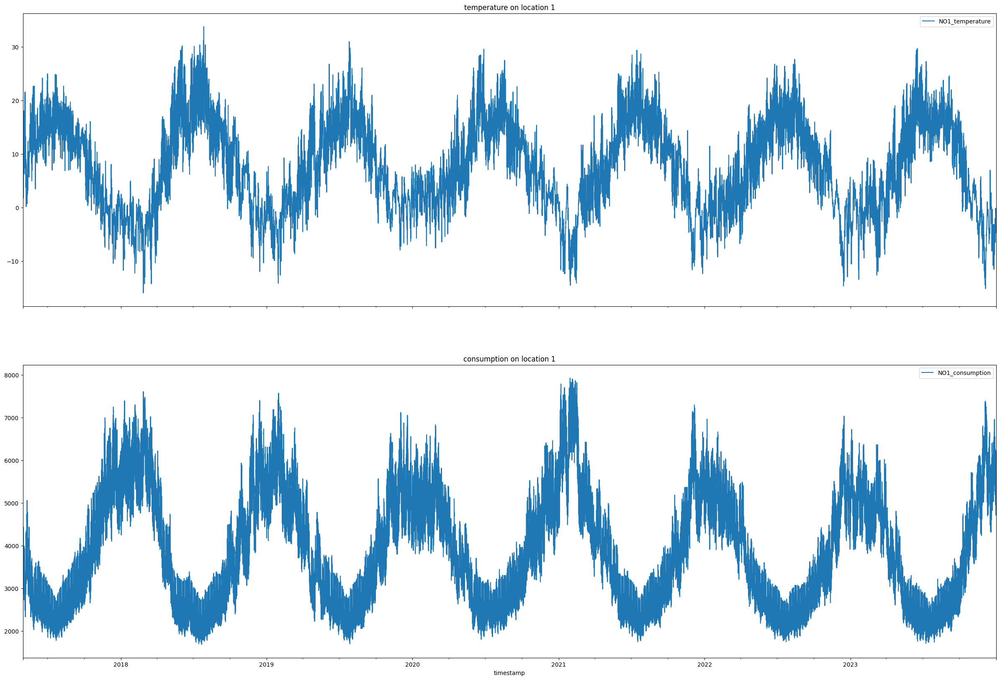

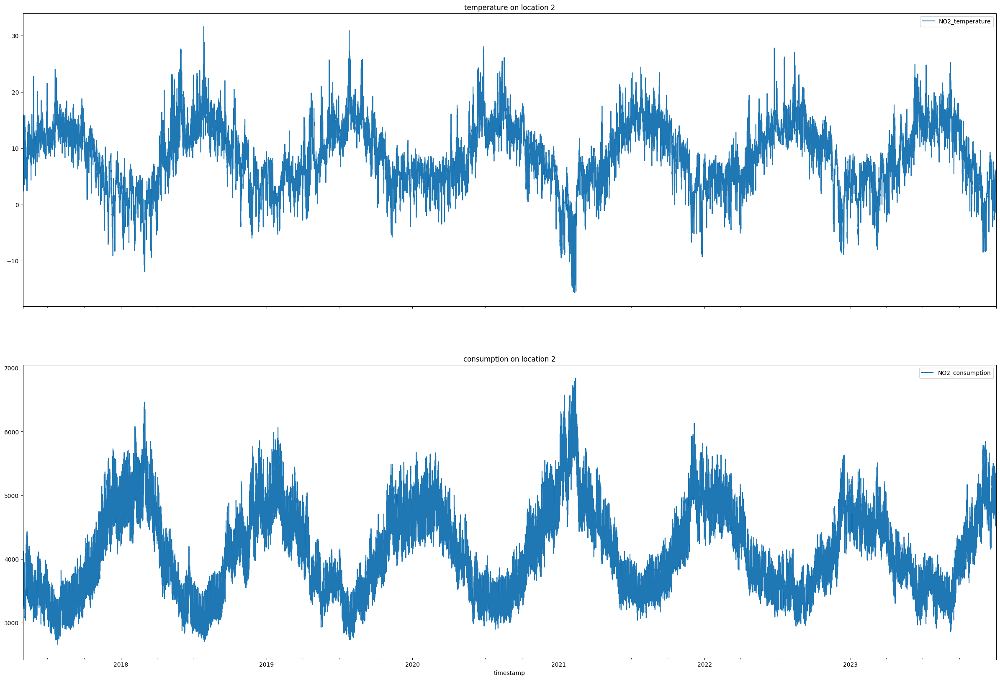

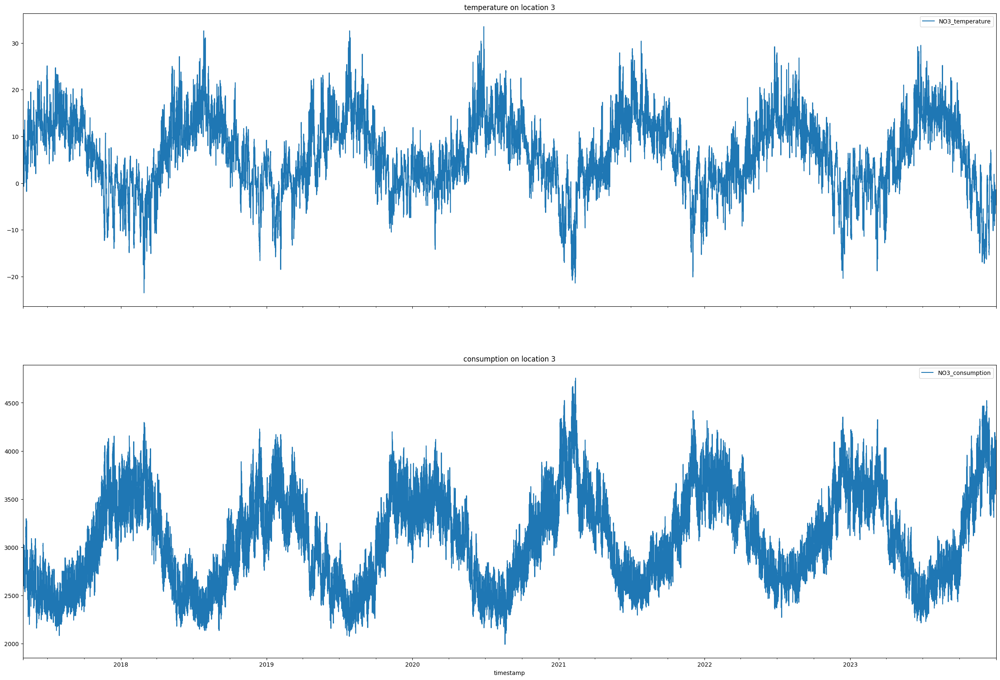

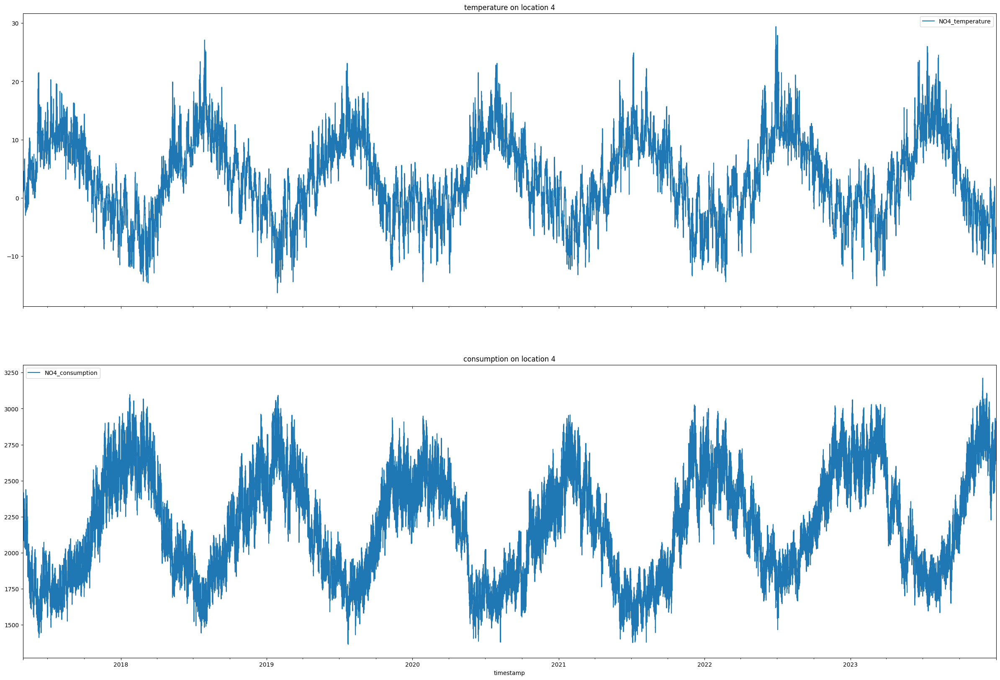

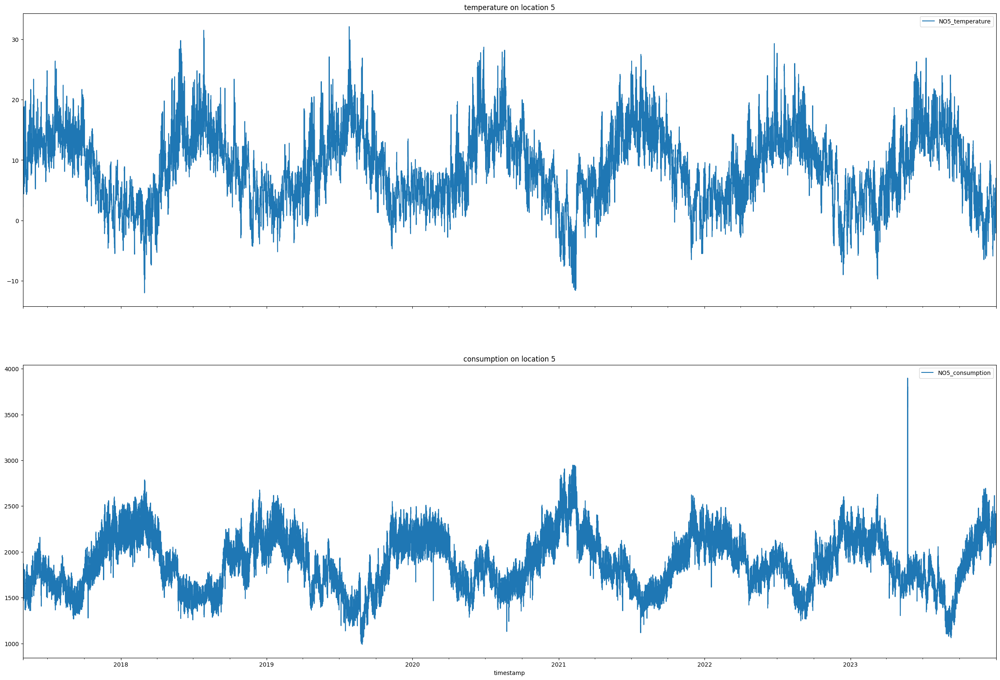

In [6]:
for i in range(1, 6):
    fig, axs = plt.subplots(2, 1, figsize=(30, 20), sharex=True)

    raw_data[['timestamp',f'NO{i}_temperature']].set_index('timestamp').plot(ax=axs[0], title=f'temperature on location {i}')
    raw_data[['timestamp',f'NO{i}_consumption']].set_index('timestamp').plot(ax=axs[1], title=f'consumption on location {i}')
    plt.plot()

### Look for correlations

<Axes: >

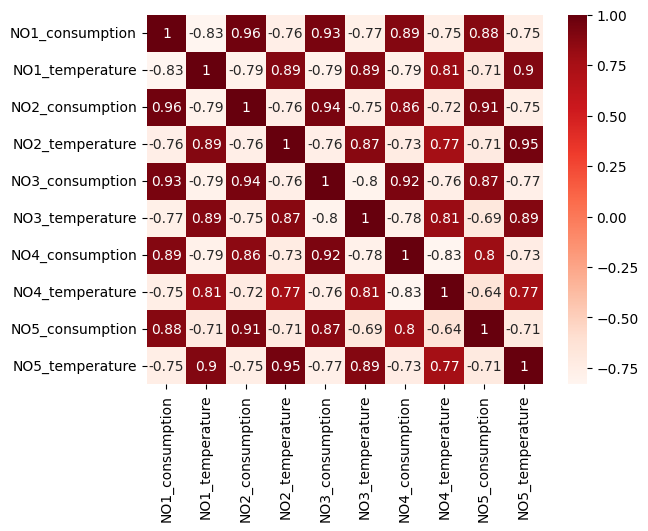

In [7]:
plt.figure()
sns.heatmap(raw_data.corr(method='pearson', numeric_only=True), annot=True, cmap=plt.cm.Reds)


<Axes: >

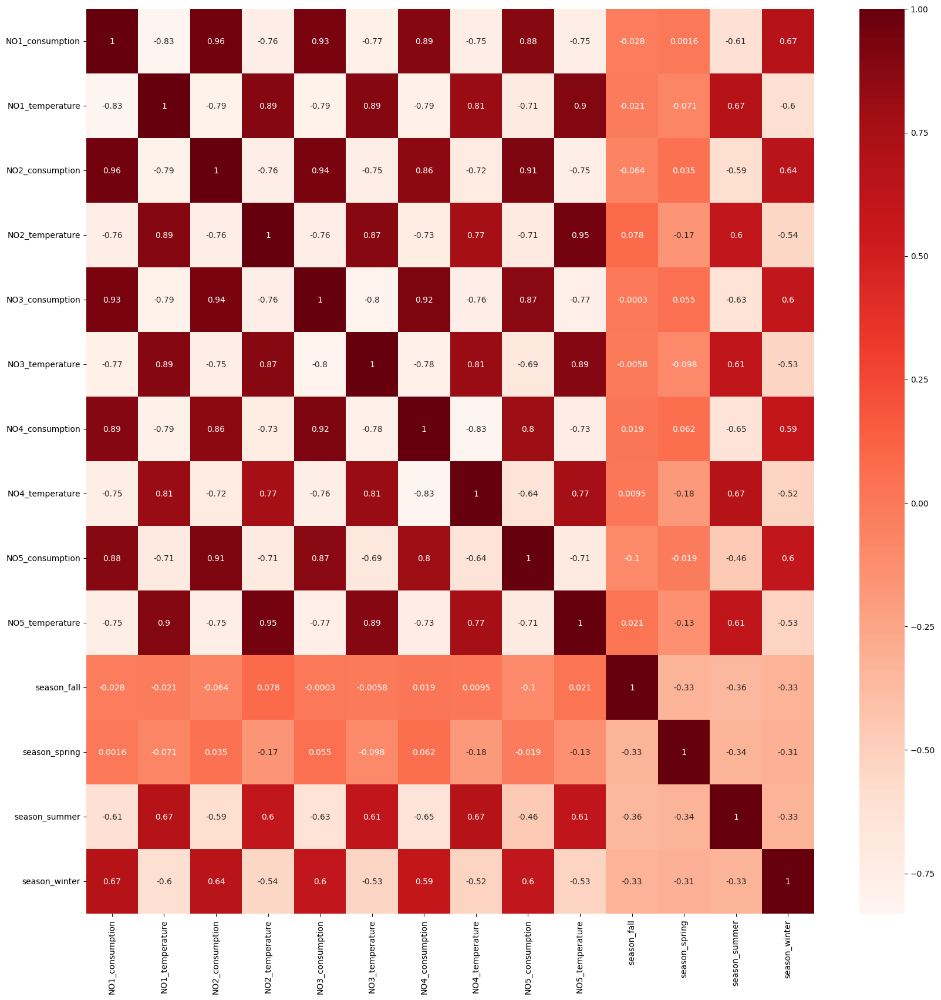

In [8]:
data_seasons, _ = pp.add_season_columns(raw_data)
plt.figure(figsize=(20, 20))
sns.heatmap(data_seasons.corr(method='pearson', numeric_only=True), annot=True, cmap=plt.cm.Reds)

### Plot output by input

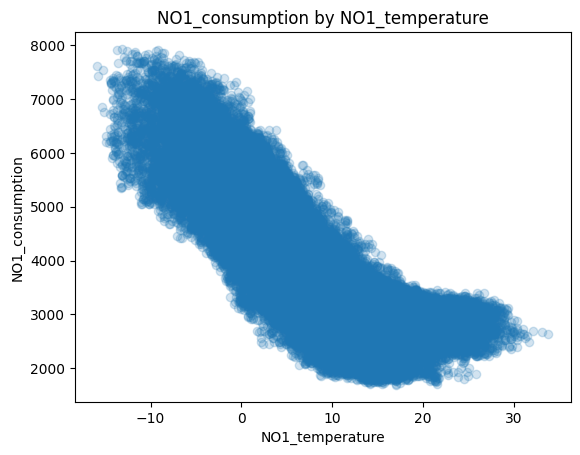

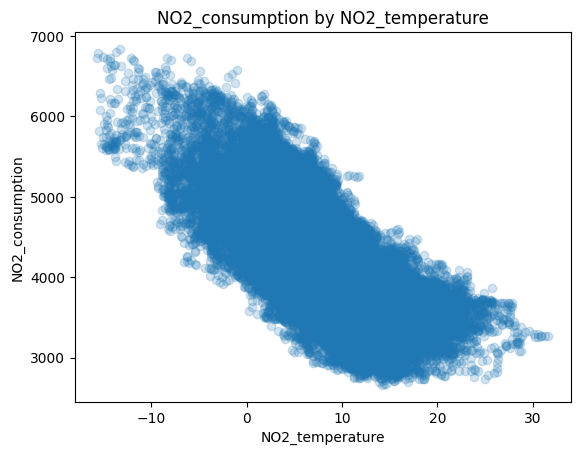

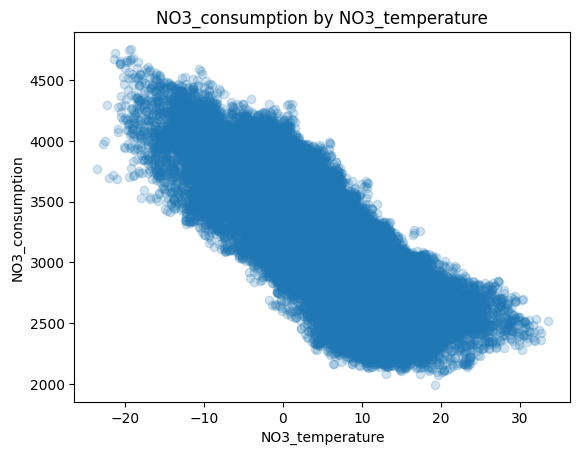

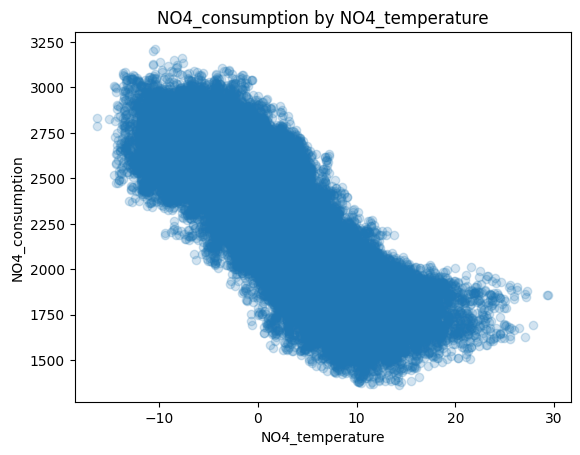

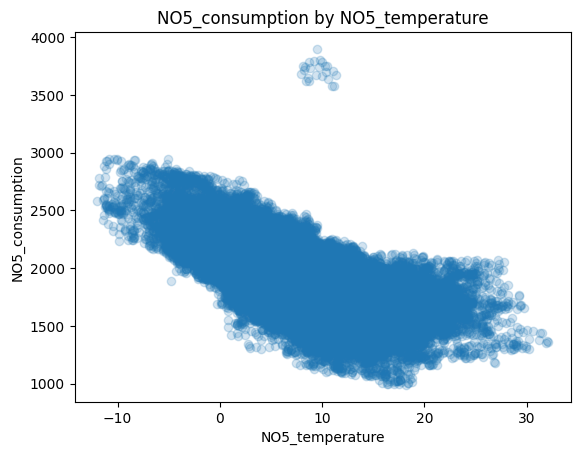

In [9]:
for i in range(1, 6):
    plt.figure()
    plt.scatter(raw_data[f'NO{i}_temperature'], raw_data[f'NO{i}_consumption'], alpha=0.2)
    plt.title(f'NO{i}_consumption by NO{i}_temperature')
    plt.xlabel(f'NO{i}_temperature')
    plt.ylabel(f'NO{i}_consumption')
    plt.plot()

In [10]:
data_hours, _ = pp.add_hour_columns(raw_data)
data_hours.columns

Index(['timestamp', 'NO1_consumption', 'NO1_temperature', 'NO2_consumption',
       'NO2_temperature', 'NO3_consumption', 'NO3_temperature',
       'NO4_consumption', 'NO4_temperature', 'NO5_consumption',
       'NO5_temperature', 'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4',
       'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11',
       'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17',
       'hour_18', 'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23'],
      dtype='object')

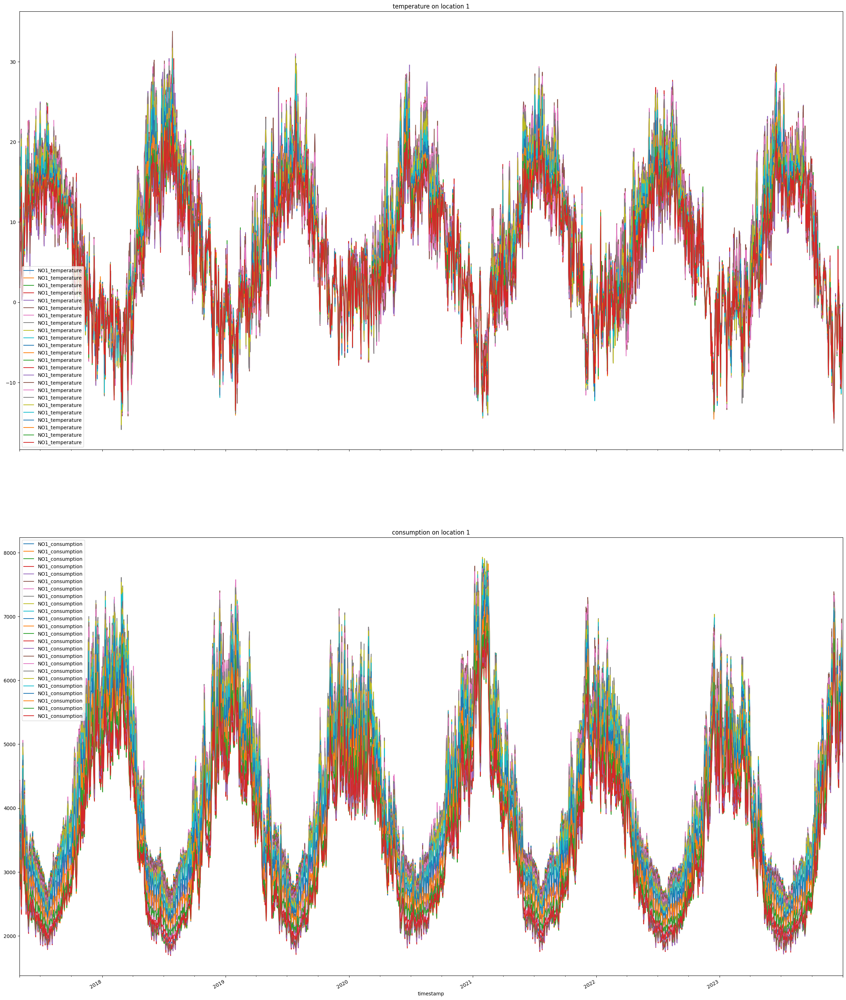

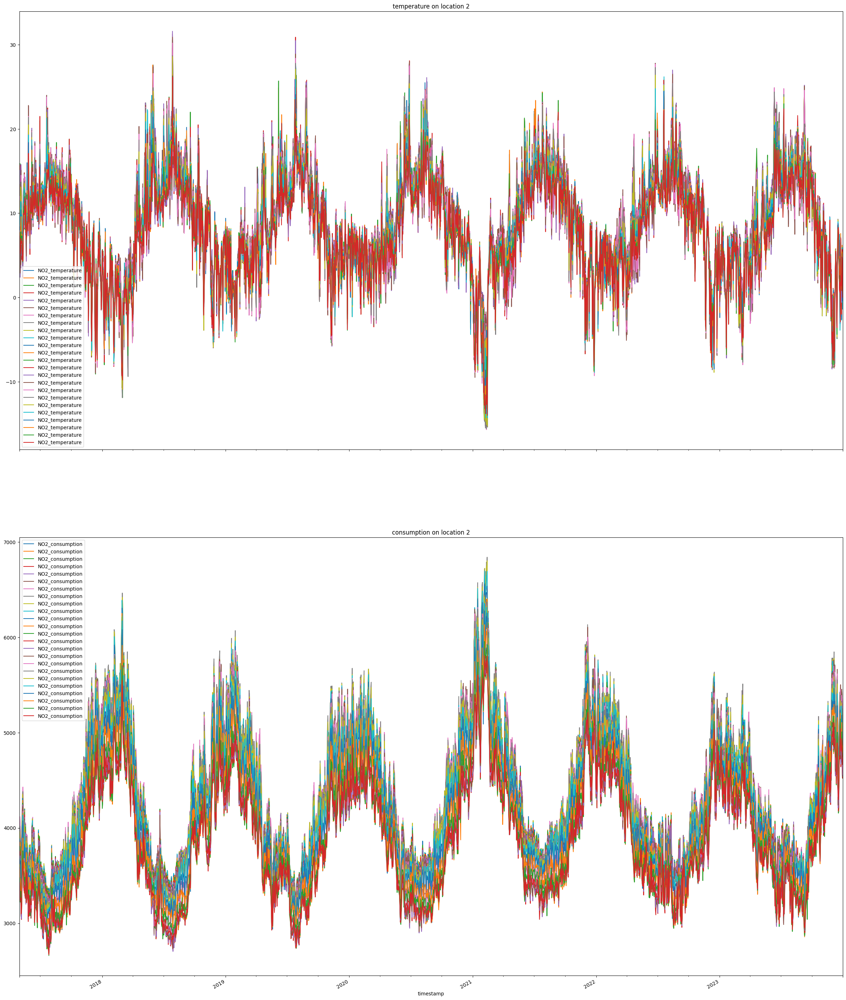

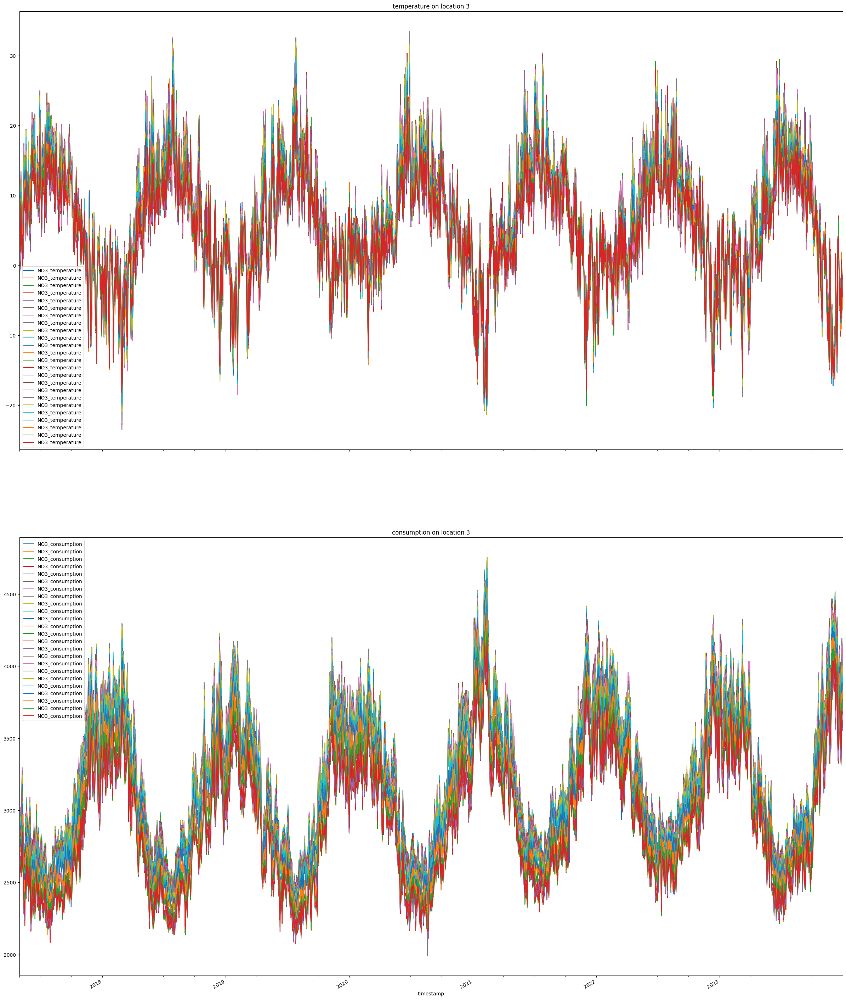

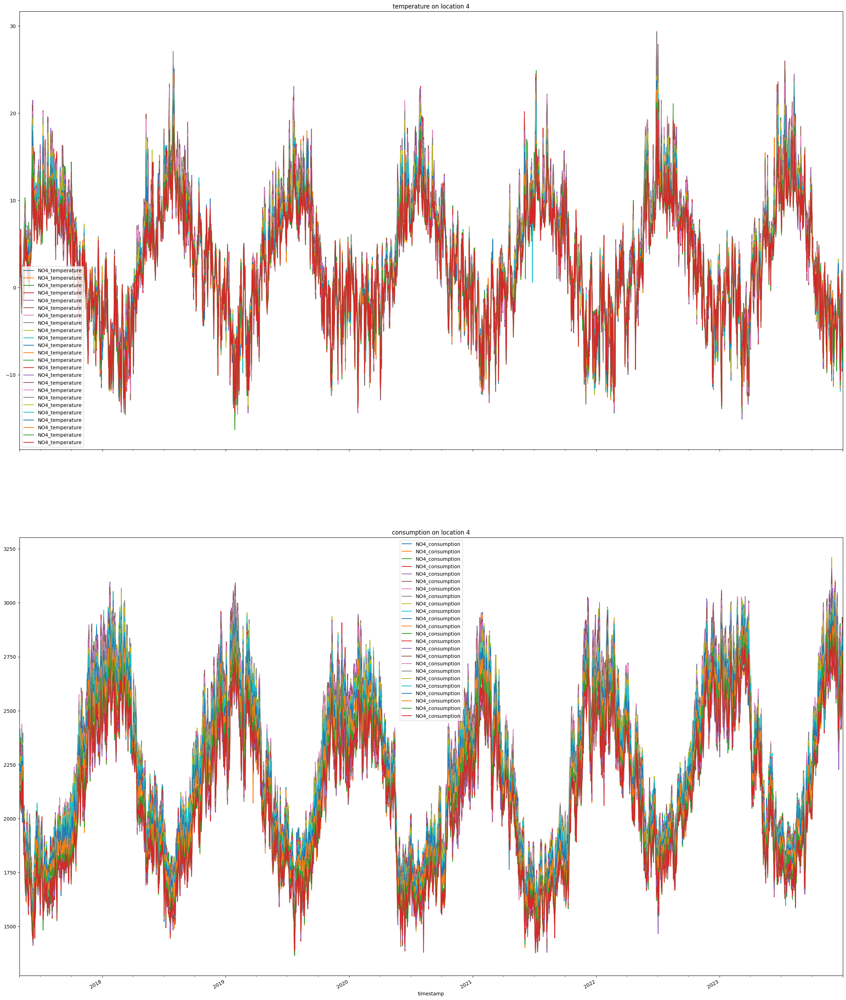

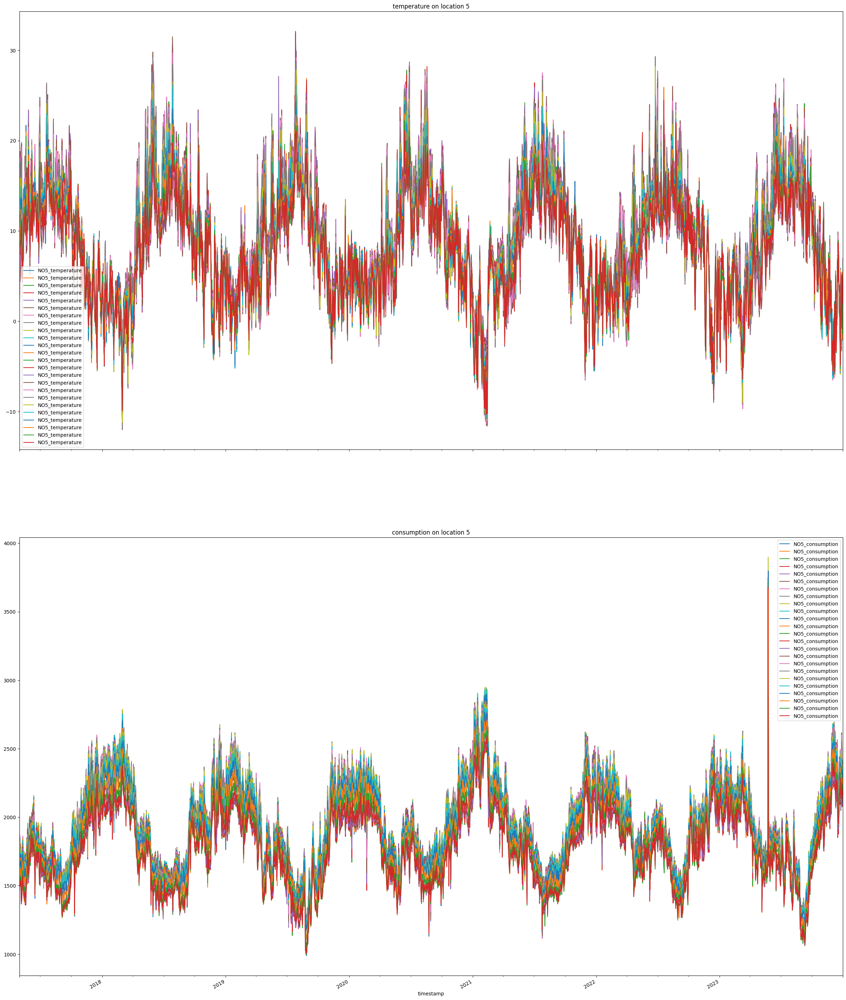

In [11]:
for i in range(1, 6):
    fig, axs = plt.subplots(2, 1, figsize=(30, 40), sharex=True)
    for h in range(24):
        data_hours[data_hours[f'hour_{h}']][['timestamp',f'NO{i}_temperature']].set_index('timestamp').plot(ax=axs[0], title=f'temperature on location {i}', label=f'temp hour={h}')
        data_hours[data_hours[f'hour_{h}']][['timestamp',f'NO{i}_consumption']].set_index('timestamp').plot(ax=axs[1], title=f'consumption on location {i}', label=f'cons hour={h}')
    plt.legend()
    plt.plot()

In [12]:
targets = [ f'NO{k}_consumption' for k in range(1, 6) ]

In [13]:
inputs = [ f'NO{k}_temperature' for k in range(1, 6) ]

In [14]:
columns_to_plot = raw_data.drop(columns='timestamp', inplace=False).columns
columns_to_plot = inputs

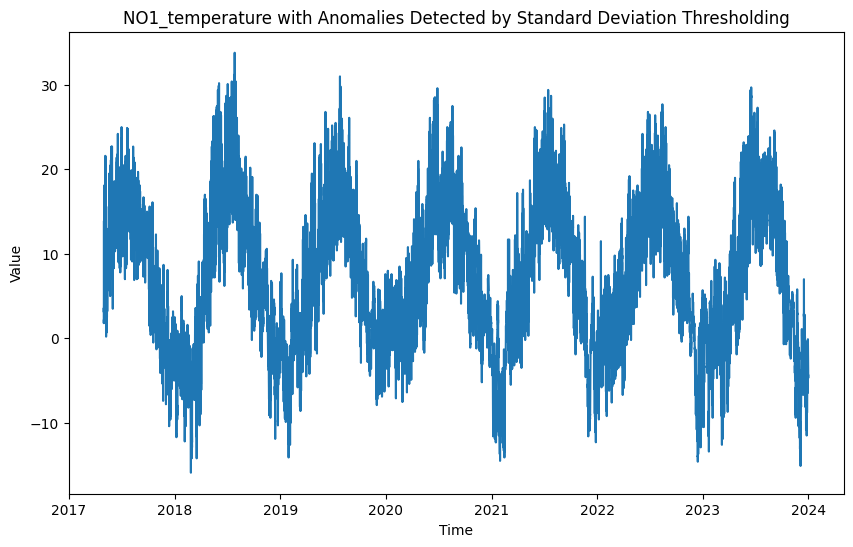

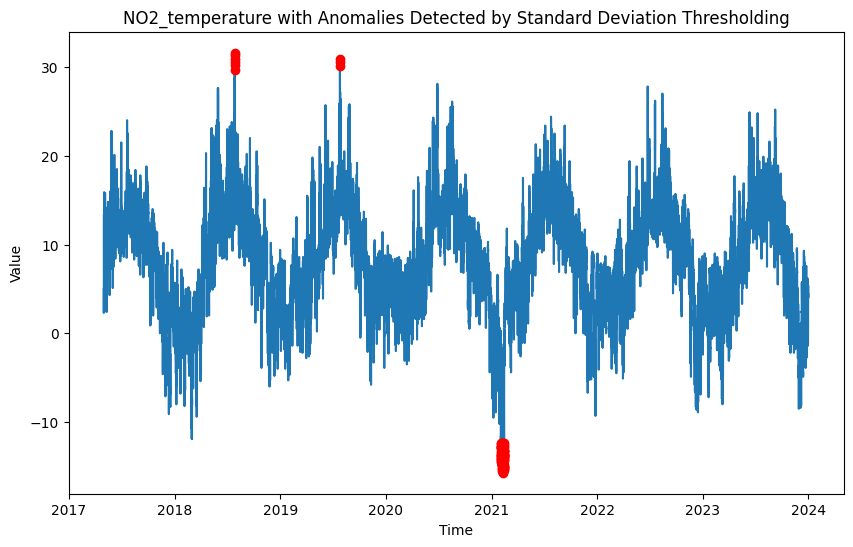

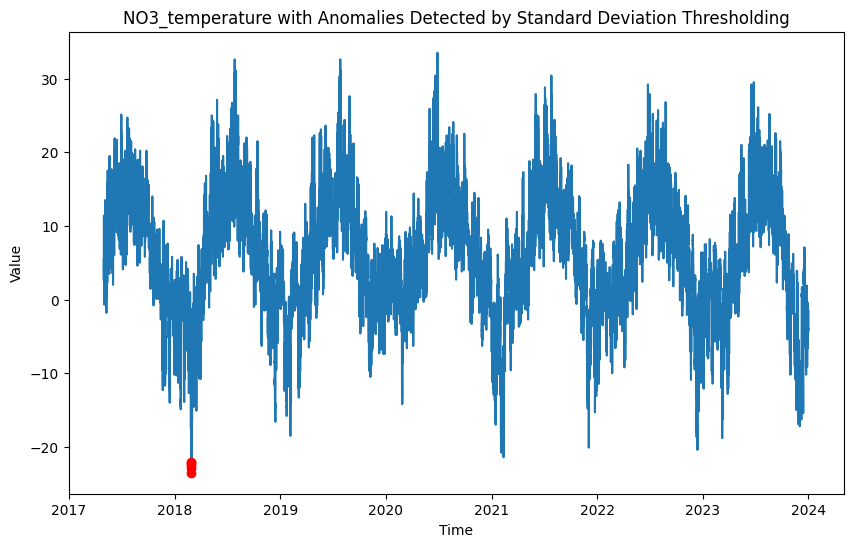

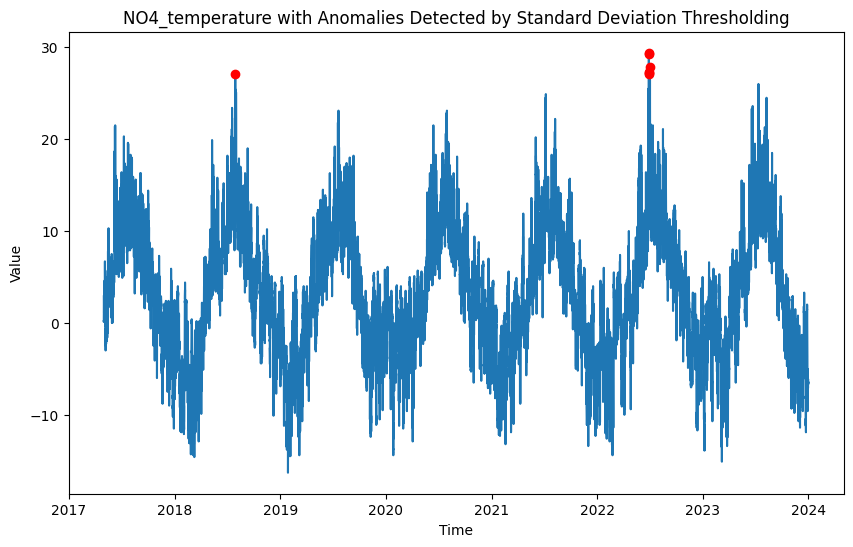

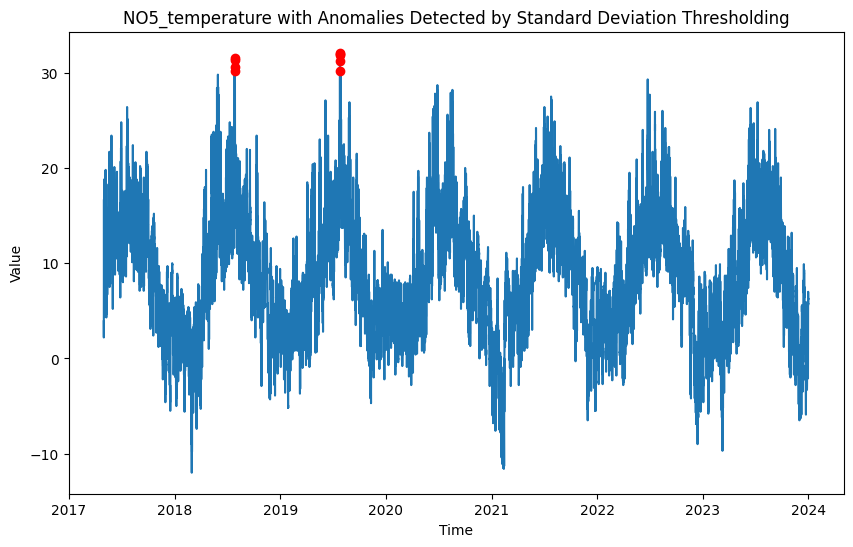

In [15]:
df = raw_data.copy()
mean = df[columns_to_plot].mean()
mean['timestamp'] = raw_data['timestamp']

std = df[columns_to_plot].std()
std['timestamp'] = raw_data['timestamp']

threshold = 3.5 * std[columns_to_plot]
anomalies = (df[columns_to_plot] - mean[columns_to_plot]).abs() > threshold

df_anomalies = df[columns_to_plot][anomalies[columns_to_plot]]

df_anomalies['timestamp'] = raw_data['timestamp']


for target in columns_to_plot:
    plt.figure(figsize=(10, 6))
    plt.plot(df['timestamp'], df[target], zorder=1)
    plt.scatter(df_anomalies['timestamp'], df_anomalies[target], color='red', label='Anomalies', zorder=2)
    plt.title(f'{target} with Anomalies Detected by Standard Deviation Thresholding')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.show()

In [20]:
df_anomalies = pp.manage_anomalies(raw_data, threshold=3.5)

In [21]:
df1 = df_anomalies[:30000]
df2 = df_anomalies[30000:]

In [26]:
df1.max(), df2.max()

(timestamp          2020-10-01 23:00:00+00:00
 NO1_consumption                  7612.109824
 NO1_temperature                         33.8
 NO2_consumption                     6464.237
 NO2_temperature                         29.2
 NO3_consumption                     4296.331
 NO3_temperature                         33.5
 NO4_consumption                     3097.133
 NO4_temperature                         25.5
 NO5_consumption                     2786.461
 NO5_temperature                         30.0
 dtype: object,
 timestamp          2023-12-31 23:00:00+00:00
 NO1_consumption                  7928.670995
 NO1_temperature                         29.7
 NO2_consumption                  6598.285279
 NO2_temperature                         27.8
 NO3_consumption                  4756.004039
 NO3_temperature                         30.4
 NO4_consumption                  3211.496268
 NO4_temperature                         26.5
 NO5_consumption                  2947.614289
 NO5_temperature  

In [30]:
columns = df1.drop(columns='timestamp', inplace=False).columns
for column in columns:
    df2[column][df2[column] > df1.max()[column]] = df1.max()[column]
    df2[column][df2[column] < df1.min()[column]] = df1.min()[column]

/var/folders/dv/nzlg6jm168311nq7f93wfrd80000gn/T/ipykernel_55591/3203924238.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2[column][df2[column] > df1.max()[column]] = df1.max()[column]


In [34]:
df2.describe()

,NO1_consumption,NO1_temperature,NO2_consumption,NO2_temperature,NO3_consumption,NO3_temperature,NO4_consumption,NO4_temperature,NO5_consumption,NO5_temperature
count,28464.000000,28464.000000,28464.000000,28464.000000,28464.000000,28464.000000,28464.000000,28464.000000,28464.000000,28464.000000
mean,3993.937379,6.770433,4264.094374,8.221418,3230.603404,5.499508,2244.180888,3.062711,1935.564371,8.166322
std,1304.625694,8.319890,667.686696,6.039116,469.191452,8.134110,368.444007,6.782779,302.196074,6.198736
min,1714.410336,-15.100000,2857.407964,-12.200000,2215.296228,-21.400000,1376.530956,-15.100000,1061.417096,-11.600000
25%,2907.254322,0.600000,3729.058879,4.300000,2842.723254,0.500000,1930.993684,-1.900000,1722.062757,3.800000
50%,3854.550796,6.400000,4176.523783,8.300000,3194.575486,5.700000,2231.749047,2.600000,1924.233250,8.200000
75%,4967.445097,13.500000,4730.084713,12.800000,3593.168874,11.500000,2541.976463,8.200000,2141.607217,12.600000
max,7612.109824,29.700000,6464.237000,27.800000,4296.331000,30.400000,3097.133000,25.500000,2786.461000,29.300000
